# Часть 1

## Импорты

In [108]:
import gensim
import json
import re
import pandas as pd
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from pymorphy2 import MorphAnalyzer
import pyLDAvis
import pyLDAvis.gensim_models # нужен этот импорт, а не import pyLDAvis.gensim
import string
from collections import Counter
import warnings
warnings.filterwarnings("ignore")
from IPython.display import Image
from IPython.core.display import HTML
from tqdm import tqdm
import numpy as np

from sklearn.decomposition import NMF
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
import pandas as pd

morph = MorphAnalyzer()
pyLDAvis.enable_notebook()

## Gensim

In [5]:
stops = set(stopwords.words('russian'))

def opt_normalize(texts, top=None):
    uniq = Counter()
    for text in texts:
        uniq.update(text)
    
    norm_uniq = {word:morph.parse(word)[0].normal_form for word, _ in uniq.most_common(top)}
    
    norm_texts = []
    for text in texts:
        
        norm_words = [norm_uniq.get(word) for word in text]
        norm_words = [word for word in norm_words if word and word not in stops]
        norm_texts.append(norm_words)
        
    return norm_texts

def tokenize(text):
    words = [word.strip(string.punctuation) for word in text.split()]
    words = [word for word in words if word]
    
    return words

In [6]:
texts = open('wiki_data.txt').read().splitlines()[:10000]
texts = opt_normalize([tokenize(text.lower()) for text in texts], 30000)

In [49]:
def build_dictinary_and_create_lda(texts, no_above_dict, no_below_dict, use_bigrams, topic_number, passes, use_tfidf):
    
    ngrammed_texts = None
    
    if use_bigrams:
        ph = gensim.models.Phrases(texts, scoring='npmi', threshold=0.4)
        p = gensim.models.phrases.Phraser(ph)
        ngrammed_texts = p[texts]
    
    if ngrammed_texts is None:
        dictinary = gensim.corpora.Dictionary(texts)
        dictinary.filter_extremes(no_above=no_above_dict, no_below=no_below_dict)
        dictinary.compactify()
        corpus = [dictinary.doc2bow(text) for text in texts]
    else:
        dictinary = gensim.corpora.Dictionary(ngrammed_texts)
        dictinary.filter_extremes(no_above=no_above_dict, no_below=no_below_dict)
        dictinary.compactify()
        corpus = [dictinary.doc2bow(text) for text in ngrammed_texts]
        texts = ngrammed_texts
    
    if use_tfidf:
        tfidf = gensim.models.TfidfModel(corpus, id2word=dictinary)
        corpus = tfidf[corpus]
    
    lda = gensim.models.LdaMulticore(corpus, topic_number, id2word=dictinary, passes=passes)
    
    return lda, corpus, dictinary, texts

In [27]:
def get_lda_metrics(lda, corpus, texts, dictinary, topic_number):
    log_perplexity = lda.log_perplexity(corpus)
    coherence_model_lda = gensim.models.CoherenceModel(model=lda,
                                                       texts=texts,
                                                       dictionary=dictinary,
                                                       coherence='c_v')
    topics = []
    for topic_id, topic in lda.show_topics(num_topics=100, formatted=False):
        topic = [word for word, _ in topic]
        topics.append(topic)
        
    coherence_model_lda = gensim.models.CoherenceModel(topics=topics, 
                                                       texts=texts, 
                                                       dictionary=dictinary, coherence='c_v')
    coherence_model_lda = coherence_model_lda.get_coherence()
    
    return log_perplexity, coherence_model_lda

In [68]:
lda1, corpus, dictinary, texts = build_dictinary_and_create_lda(texts=texts,
                                      no_above_dict=0.1,
                                      no_below_dict=20,
                                      use_bigrams=False,
                                      topic_number=200,
                                      passes=25,
                                      use_tfidf=False)

lp, cm = get_lda_metrics(lda=lda1, corpus=corpus, texts=texts, dictinary=dictinary, topic_number=200)
print('log perplexity', lp, 'coherence_model_lda', cm)

log perplexity -8.299380296616038 coherence_model_lda 0.5045028166268721


In [69]:
pyLDAvis.gensim_models.prepare(lda1, corpus, dictinary)

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
126   -0.290069 -0.067915       1        1  2.359866
165    0.041241  0.045589       2        1  2.298936
79    -0.041511  0.095976       3        1  2.257068
55    -0.190982  0.114601       4        1  2.253946
62    -0.020741  0.160307       5        1  2.110790
...         ...       ...     ...      ...       ...
108    0.041963  0.033403     196        1  0.129029
130    0.006371  0.010311     197        1  0.127282
184   -0.021925 -0.042085     198        1  0.118067
166    0.031868 -0.014678     199        1  0.115416
45     0.043894  0.039576     200        1  0.114461

[200 rows x 5 columns], topic_info=           Term         Freq        Total  Category  logprob  loglift
1015          г  2619.000000  2619.000000   Default  30.0000  30.0000
1856       тело  1065.000000  1065.000000   Default  29.0000  29.0000
80       остров  1339.000000  1339.000000   Default  28.0000  28.0000
176        игра  1725.000000  1725.000000   Default  27.0000  27.0000
52         село  1521.000000  1521.000000   Default  26.0000  26.0000
...         ...          ...          ...       ...      ...      ...
953      оружие     4.413787   255.214841  Topic200  -5.3420   2.7153
1738  следующий     5.630198   990.556061  Topic200  -5.0986   1.6026
859     назвать     5.193382   643.932654  Topic200  -5.1794   1.9525
100    например     5.167468   807.608276  Topic200  -5.1844   1.7210
769   результат     5.480340  1272.326095  Topic200  -5.1256   1.3253

[10432 rows x 6 columns], token_table=      Topic      Freq Term
term                      
4177      9  0.016056    0
4177     15  0.032113    0
4177     19  0.048169    0
4177     21  0.064226    0
4177     37  0.016056    0
...     ...       ...  ...
2862    142  0.031499  №_1
2862    176  0.015750  №_1
2862    182  0.047249  №_1
2862    184  0.015750  №_1
2862    194  0.094497  №_1

[108332 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[127, 166, 80, 56, 63, 108, 168, 13, 2, 121, 65, 96, 200, 21, 30, 79, 31, 103, 45, 64, 20, 93, 51, 66, 195, 186, 123, 196, 43, 142, 136, 132, 69, 133, 74, 36, 100, 82, 94, 17, 99, 62, 113, 37, 169, 137, 115, 181, 78, 158, 159, 147, 9, 60, 126, 128, 107, 3, 53, 118, 47, 157, 175, 61, 91, 71, 90, 68, 154, 16, 150, 104, 11, 15, 105, 52, 39, 180, 182, 83, 188, 10, 184, 177, 139, 18, 174, 192, 129, 48, 172, 143, 140, 6, 7, 164, 153, 70, 23, 29, 162, 151, 135, 27, 190, 120, 189, 160, 8, 191, 34, 130, 73, 110, 173, 32, 95, 122, 199, 183, 165, 25, 44, 50, 97, 155, 187, 54, 12, 72, 81, 22, 59, 116, 149, 14, 197, 193, 19, 141, 85, 170, 55, 41, 58, 49, 42, 178, 144, 148, 26, 57, 35, 40, 92, 86, 124, 5, 24, 179, 1, 145, 28, 88, 87, 138, 163, 98, 102, 67, 171, 33, 84, 117, 198, 119, 146, 194, 114, 77, 101, 112, 152, 176, 76, 111, 125, 89, 38, 156, 106, 4, 134, 75, 161, 109, 131, 185, 167, 46])

In [93]:
lda2, corpus, dictinary, texts = build_dictinary_and_create_lda(texts=texts,
                                      no_above_dict=0.1,
                                      no_below_dict=20,
                                      use_bigrams=True,
                                      topic_number=150,
                                      passes=25,
                                      use_tfidf=False)

lp, cm = get_lda_metrics(lda=lda2, corpus=corpus, texts=texts, dictinary=dictinary, topic_number=150)
print('log perplexity', lp, 'coherence_model_lda', cm)

log perplexity -8.07269312496828 coherence_model_lda 0.5147363947638639


In [94]:
pyLDAvis.gensim_models.prepare(lda2, corpus, dictinary, sort_topics=False)

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
0     -0.099862 -0.028860       1        1  1.486129
1     -0.088488 -0.016410       2        1  0.226334
2      0.034524  0.233264       3        1  2.042398
3      0.099162  0.088045       4        1  0.282047
4      0.127551 -0.004093       5        1  0.651751
...         ...       ...     ...      ...       ...
145    0.039126 -0.021021     146        1  0.487781
146   -0.007105  0.074265     147        1  0.397489
147   -0.048358  0.016659     148        1  0.270193
148    0.086594 -0.066533     149        1  0.205911
149    0.087133  0.000584     150        1  0.131144

[150 rows x 5 columns], topic_info=             Term         Freq        Total  Category  logprob  loglift
1856         тело  1042.000000  1042.000000   Default  30.0000  30.0000
80         остров  1310.000000  1310.000000   Default  29.0000  29.0000
73          фильм  1356.000000  1356.000000   Default  28.0000  28.0000
1015            г  2580.000000  2580.000000   Default  27.0000  27.0000
52           село  1474.000000  1474.000000   Default  26.0000  26.0000
...           ...          ...          ...       ...      ...      ...
1380     2006_год     5.076617   518.917478  Topic150  -5.3382   2.0095
1369       январь     5.677957  1322.521708  Topic150  -5.2262   1.1859
1514  участвовать     4.993989   945.672487  Topic150  -5.3546   1.3930
538             5     4.953360  1205.138208  Topic150  -5.3628   1.1423
0               1     4.957840  1533.913784  Topic150  -5.3619   0.9020

[7793 rows x 6 columns], token_table=      Topic      Freq Term
term                      
4177      7  0.142104    0
4177     25  0.047368    0
4177     42  0.252630    0
4177     43  0.015789    0
4177     53  0.015789    0
...     ...       ...  ...
399     131  0.003057    №
399     134  0.044329    №
399     139  0.177316    №
399     140  0.004586    №
399     150  0.004586    №

[83209 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150])

In [100]:
lda2.print_topic(26)

'0.015*"август" + 0.014*"армия" + 0.012*"командир" + 0.012*"октябрь" + 0.011*"сентябрь" + 0.011*"ноябрь" + 0.011*"полка" + 0.011*"бой" + 0.010*"июль" + 0.010*"апрель"'

In [101]:
lda2.print_topic(106)

'0.016*"убийство" + 0.014*"убить" + 0.013*"дом" + 0.009*"тюрьма" + 0.009*"полиция" + 0.008*"арестовать" + 0.007*"убийца" + 0.007*"жертва" + 0.006*"побег" + 0.006*"женщина"'

In [102]:
lda2.print_topic(3)

'0.090*"список" + 0.046*"ссср" + 0.020*"швейцария" + 0.016*"кантон" + 0.012*"армения" + 0.011*"швейцарский" + 0.011*"должность" + 0.010*"муниципальный_образование" + 0.010*"350" + 0.008*"советский_союз"'

In [71]:
lda3, corpus, dictinary, texts = build_dictinary_and_create_lda(texts=texts,
                                      no_above_dict=0.2,
                                      no_below_dict=50,
                                      use_bigrams=False,
                                      topic_number=150,
                                      passes=10,
                                      use_tfidf=True)

lp, cm = get_lda_metrics(lda=lda3, corpus=corpus, texts=texts, dictinary=dictinary, topic_number=150)
print('log perplexity', lp, 'coherence_model_lda', cm)

log perplexity -29.597899575799648 coherence_model_lda 0.43546075627016945


In [75]:
pyLDAvis.gensim_models.prepare(lda3, corpus, dictinary, mds='mmds')

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0      0.339396  0.215319       1        1  25.349526
139   -0.074126 -0.462925       2        1   5.709022
149   -0.032537 -0.484906       3        1   5.014353
19    -0.303330 -0.380855       4        1   4.513551
119    0.181294 -0.463246       5        1   2.883108
...         ...       ...     ...      ...        ...
55     0.001323  0.025878     146        1   0.120783
61     0.001261  0.025810     147        1   0.120783
67     0.000978  0.025945     148        1   0.120783
68     0.001038  0.025736     149        1   0.120783
3      0.001069  0.026041     150        1   0.120783

[150 rows x 5 columns], topic_info=               Term        Freq       Total  Category  logprob  loglift
1426           тело  255.000000  255.000000   Default  30.0000  30.0000
72           остров  117.000000  117.000000   Default  29.0000  29.0000
514         женщина  120.000000  120.000000   Default  28.0000  28.0000
43      расположить  107.000000  107.000000   Default  27.0000  27.0000
45             село  145.000000  145.000000   Default  26.0000  26.0000
...             ...         ...         ...       ...      ...      ...
25    исключительно    0.020161    1.654813  Topic150  -7.9201   2.3112
26     использовать    0.020161   48.235783  Topic150  -7.9201  -1.0612
27         источник    0.020161   28.597281  Topic150  -7.9201  -0.5384
28        казанский    0.020161   12.831648  Topic150  -7.9201   0.2630
29           камень    0.020161   16.528170  Topic150  -7.9201   0.0099

[7169 rows x 6 columns], token_table=      Topic      Freq    Term
term                         
438       3  0.189463     000
438       4  0.126309     000
438      10  0.126309     000
438      21  0.189463     000
438      60  0.315772     000
...     ...       ...     ...
1965     50  0.036341       –
361      40  0.955766  —_село
347       3  0.343761       №
347       7  0.122772       №
347      72  0.466532       №

[5571 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 140, 150, 20, 120, 92, 15, 91, 65, 78, 52, 71, 116, 17, 75, 31, 59, 8, 89, 143, 80, 19, 43, 36, 99, 131, 86, 118, 66, 63, 144, 96, 141, 42, 127, 7, 115, 113, 33, 81, 76, 133, 24, 126, 74, 112, 5, 27, 70, 41, 104, 58, 57, 21, 98, 110, 60, 45, 134, 46, 101, 82, 64, 119, 136, 35, 30, 132, 25, 9, 29, 32, 109, 48, 114, 107, 14, 38, 51, 13, 123, 111, 54, 77, 55, 73, 146, 135, 50, 106, 88, 128, 26, 125, 100, 147, 84, 18, 16, 53, 130, 10, 37, 11, 12, 122, 108, 93, 95, 117, 83, 105, 90, 40, 148, 28, 3, 139, 6, 49, 61, 22, 124, 23, 2, 97, 39, 79, 87, 67, 149, 137, 103, 72, 138, 102, 142, 94, 145, 85, 129, 34, 121, 44, 47, 56, 62, 68, 69, 4])

In [103]:
lda4, corpus, dictinary, texts = build_dictinary_and_create_lda(texts=texts,
                                      no_above_dict=0.2,
                                      no_below_dict=50,
                                      use_bigrams=True,
                                      topic_number=150,
                                      passes=10,
                                      use_tfidf=True)

lp, cm = get_lda_metrics(lda=lda4, corpus=corpus, texts=texts, dictinary=dictinary, topic_number=150)
print('log perplexity', lp, 'coherence_model_lda', cm)

log perplexity -31.284752327567137 coherence_model_lda 0.42347924062919057


In [104]:
pyLDAvis.gensim_models.prepare(lda4, corpus, dictinary, mds='mmds', sort_topics=False)

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
0      0.398526 -0.108586       1        1  0.403324
1     -0.092953 -0.295648       2        1  0.267509
2      0.131831  0.104461       3        1  0.171497
3     -0.066138 -0.011704       4        1  0.149006
4     -0.282787 -0.341528       5        1  0.552657
...         ...       ...     ...      ...       ...
145    0.245008  0.250717     146        1  0.279039
146   -0.430553 -0.289302     147        1  2.898575
147   -0.419355  0.230810     148        1  0.790897
148    0.016731  0.014943     149        1  0.121977
149   -0.475254 -0.100914     150        1  0.586351

[150 rows x 5 columns], topic_info=           Term        Freq       Total  Category  logprob  loglift
1426       тело  270.000000  270.000000   Default  30.0000  30.0000
514     женщина  122.000000  122.000000   Default  29.0000  29.0000
45         село  152.000000  152.000000   Default  28.0000  28.0000
39      посёлок   88.000000   88.000000   Default  27.0000  27.0000
72       остров  106.000000  106.000000   Default  26.0000  26.0000
...         ...         ...         ...       ...      ...      ...
265      студия    1.120107   17.595127  Topic150  -5.4826   2.3848
870     политик    0.655328   11.788976  Topic150  -6.0186   2.2492
2045  журналист    0.373927    7.222722  Topic150  -6.5797   2.1781
123      версия    2.014495   48.800507  Topic150  -4.8956   1.9516
192       новый    1.857772  110.630289  Topic150  -4.9766   1.0522

[6835 rows x 6 columns], token_table=      Topic      Freq Term
term                      
438      24  0.528165  000
438      83  0.226357  000
438     147  0.075452  000
0        43  0.127179    1
0        54  0.023123    1
...     ...       ...  ...
347      43  0.024229    №
347      87  0.121146    №
347      90  0.484586    №
347     117  0.145376    №
347     137  0.145376    №

[6431 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150])

In [105]:
lda4.print_topic(66)

'0.000*"90" + 0.000*"ирландия" + 0.000*"суметь" + 0.000*"сценарий" + 0.000*"точно" + 0.000*"уважение" + 0.000*"уильям" + 0.000*"утвердить" + 0.000*"характерный" + 0.000*"стадион"'

In [106]:
lda4.print_topic(54)

'0.306*"село" + 0.196*"волость" + 0.077*"1921" + 0.074*"звезда" + 0.048*"1923" + 0.047*"солнце" + 0.042*"1922" + 0.034*"наблюдение" + 0.034*"сельский" + 0.004*"существовать"'

In [107]:
lda4.print_topic(25)

'0.187*"клуб" + 0.106*"команда" + 0.083*"тренер" + 0.065*"чемпион" + 0.061*"сборная" + 0.042*"участие" + 0.039*"олимпиада" + 0.036*"1989" + 0.030*"матч" + 0.027*"участвовать"'

В целом становится видно что при использовании Tf-idf получаются хорошие маленькие кластеры и несколько больших. Я считаю что это лучше так как при дальнейшем анализе мы бы могли детальнее изучать большие классы и строить модели для них отедльные. А так можем выделить много небольших классов. Плюс они получаются разделимы.

## Sklearn

### первая версия

In [109]:
texts = open('wiki_data.txt').read().splitlines()[:10000]
texts = opt_normalize([tokenize(text.lower()) for text in texts], 30000)

stexts = [' '.join(text) for text in texts]

vectorizer = TfidfVectorizer(max_features=2000, min_df=10, max_df=0.1, ngram_range=(1,2))
X = vectorizer.fit_transform(stexts)

model = NMF(n_components=100)

In [110]:
model.fit(X)

NMF(n_components=100)

In [111]:
model.components_.shape

(100, 2000)

In [113]:
model.transform(X).shape

(10000, 100)

In [112]:
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 100)

In [114]:
feat_names = vectorizer.get_feature_names()

In [115]:
top_words = model.components_.argsort()[:,:-5:-1]

for i in range(top_words.shape[0]):
    words = [feat_names[j] for j in top_words[i]]
    print(i, "--".join(words))

0 летний олимпийский--летний--олимпийский игра--участие летний
1 составлять человек--совет--сельский совет--27
2 использовать--использоваться--форма--например
3 харьковский--расстояние км--расстояние--км
4 зимний олимпийский--зимний--олимпийский игра--участие зимний
5 украина находиться--области код--19--старый
6 матч--забить--гол--сборная
7 новоград--новоград волынский--волынский--области население
8 хутор--ростовский--район ростовский--ростовский области
9 мм--длина--лист--питаться
10 овручский--области код--сергей--13
11 альбом--выпустить--выйти--композиция
12 емильчинский--области код--23--80
13 малинский--площадь км²--км²--области код
14 остров--метр--километр--относиться
15 уезд--год уезд--губерния--специальный район
16 населить пункт--населить--пункт--различный
17 хорошевский--области население--украина находиться--украина основать
18 фильм--режиссёр--снять--картина
19 украина основать--год находиться--области код--16
20 роль--сериал--актриса--актёр
21 коростенский--17--50--году

In [116]:
model.reconstruction_err_

75.33882897694623

### Вторая версия

In [118]:
texts = open('wiki_data.txt').read().splitlines()[:10000]
texts = opt_normalize([tokenize(text.lower()) for text in texts], 30000)

stexts = [' '.join(text) for text in texts]

vectorizer = TfidfVectorizer(max_features=2000, min_df=10, max_df=0.1, ngram_range=(1,2))
X = vectorizer.fit_transform(stexts)

model = NMF(n_components=150)

model.fit(X)

feat_names = vectorizer.get_feature_names()

top_words = model.components_.argsort()[:,:-5:-1]

for i in range(top_words.shape[0]):
    words = [feat_names[j] for j in top_words[i]]
    print(i, "--".join(words))

0 летний олимпийский--летний--олимпийский игра--участие летний
1 украина основать--год находиться--27--области население
2 армия--войско--военный--сила
3 берег--берег река--левый берег--течение
4 зимний олимпийский--зимний--олимпийский игра--участие зимний
5 составлять человек--административный центр--совет--27
6 матч--забить--гол--сборная
7 новоград волынский--новоград--волынский--области население
8 хутор--ростовский--район ростовский--ростовский области
9 мм--длина--ширина--длинный
10 овручский--сергей--13--24
11 версия--использовать--windows--выпустить
12 емильчинский--23--области код--25
13 малинский--площадь км²--1917 год--1917
14 остров--относиться--километр--пролив
15 уезд--год уезд--губерния--специальный район
16 населить пункт--населить--пункт--воронежский
17 хорошевский--области население--молодёжный--40
18 фильм--режиссёр--снять--картина
19 области код--50--малый--16
20 международный--участник--1976--1977
21 коростенский--17--году--50
22 де--французский--франция--париж
23 р

In [119]:
model.reconstruction_err_

71.56818748826818

### третья версия

In [120]:
texts = open('wiki_data.txt').read().splitlines()[:10000]
texts = opt_normalize([tokenize(text.lower()) for text in texts], 30000)

stexts = [' '.join(text) for text in texts]

vectorizer = CountVectorizer(max_features=2000, min_df=20, max_df=0.15, ngram_range=(1,2))
X = vectorizer.fit_transform(stexts)

model = NMF(n_components=150)

model.fit(X)

feat_names = vectorizer.get_feature_names()

top_words = model.components_.argsort()[:,:-5:-1]

for i in range(top_words.shape[0]):
    words = [feat_names[j] for j in top_words[i]]
    print(i, "--".join(words))

0 подвеска--автомобиль--колесо--поперечный
1 войско--фронт--армия--январь
2 2010--2010 год--2011--2011 год
3 игра--of--карта--студия
4 турнир--финал--открытый--открытый чемпионат
5 лёд--экспедиция--собака--день
6 уезд--округ--городской--специальный
7 уезд--волость--губерния--год уезд
8 экспедиция--лёд--команда--северный
9 брак--право--россия--российский
10 раунд--проиграть--счёт--турнир
11 религиозный--передача--здание--имущество
12 команда--тренер--чемпионат--лига
13 дивизия--1941--1941 год--стрелковый
14 крейсер--корабль--китайский--японский
15 китайский--её--архитектура--китай
16 житомирский--житомирский область--район житомирский--индекс
17 доктор--серия--эпизод--говорить
18 группа--участник--сингл--концерт
19 де--герцог--французский--франция
20 летний--летний олимпийский--олимпийский игра--олимпийский
21 территория--страна--россия--гражданин
22 гонка--выиграть--победа--второй
23 экономический--общество--россия--российский
24 самолёт--установить--км--крыло
25 батальон--полка--полк-

In [121]:
model.reconstruction_err_

1087.2625589313302

В целом версия модели из Генсим мне нравится больше, тут кажется, что все равно не хватает тем. Однако тут заметно положительное влияние TF-IDF, оно добавлет очень много, мез него потеря информации очень сильная.


# Часть 2

## модель 1

In [1]:
%env ARTM_SHARED_LIBRARY=/opt/bigartm/lib/libartm.dylib

env: ARTM_SHARED_LIBRARY=/opt/bigartm/lib/libartm.dylib


In [4]:
import artm
%matplotlib inline
import glob
import os, re
import matplotlib.pyplot as plt
from collections import defaultdict, Counter
from nltk.corpus import stopwords
import numpy as np
from pymorphy2 import MorphAnalyzer
import gensim, nltk
import string
morph = MorphAnalyzer()
from nltk.tokenize import word_tokenize

In [5]:
stops = set(stopwords.words('russian'))


def opt_normalize(texts, top=None):
    uniq = Counter()
    for text in texts:
        uniq.update(text)
    
    norm_uniq = {word:morph.parse(word.replace(':', ''))[0].normal_form for word, _ in uniq.most_common(top)}
    
    norm_texts = []
    for text in texts:
        
        norm_words = [norm_uniq.get(word) for word in text]
        norm_words = [word for word in norm_words if word and word not in stops]
        norm_texts.append(norm_words)
        
    return norm_texts

def tokenize(text):
    words = [word.strip(string.punctuation) for word in text.split()]
    words = [word for word in words if word]
    
    return words

In [6]:
texts = open('wiki_data.txt').read().splitlines()
texts = opt_normalize([tokenize(text.lower()) for text in texts], 30000)

In [7]:
f = open('wiki_texts.vw', 'w')

for i, text in enumerate(texts):
    c = Counter(text)
    doc = 'doc_'+ str(i) + ' '
    vw_text = ' '.join([x+':'+str(c[x]) for x in c])
    
    f.write(doc + vw_text  + '\n')
f.close()

In [8]:
def print_measures(model_artm):
    print('Sparsity Phi: {0:.3f} ARTM)'.format(
        model_artm.score_tracker['SparsityPhiScore'].last_value)
)
    print('Sparsity Theta: {0:.3f} (ARTM)'.format(
        model_artm.score_tracker['SparsityThetaScore'].last_value))

    print('Kernel contrast: {0:.3f} (ARTM)'.format(
        model_artm.score_tracker['TopicKernelScore'].last_average_contrast))

    print('Kernel purity: {0:.3f} (ARTM)'.format(
        model_artm.score_tracker['TopicKernelScore'].last_average_purity))

    print('Perplexity: {0:.3f} (ARTM)'.format(
        model_artm.score_tracker['PerplexityScore'].last_value)
)
    plt.plot(range(model_artm.num_phi_updates), model_artm.score_tracker['PerplexityScore'].value, 'r--', linewidth=2)
    plt.xlabel('Iterations count')
    plt.ylabel(' ARTM perp. (red)')
    plt.grid(True)
    plt.show()

In [9]:
batch_vectorizer = artm.BatchVectorizer(data_path='wiki_texts.vw',  # название файла
                                        data_format='vowpal_wabbit', # формат файла, у нас vw
                                        target_folder='batches', # название папки в которую положаться батчи
                                       batch_size=1000) # размер батча, подбирайте под свою память

In [10]:
batch_vectorizer = artm.BatchVectorizer(data_path='batches', # название папки с батчами
                                        data_format='batches') # указываем формат - батчи

In [11]:
# инициализируем словарь, чтобы сделать модель
dictionary = artm.Dictionary()

In [12]:
dictionary.gather(data_path='batches')
dictionary.filter(class_id='@default_class',
                  min_df=10, max_df=2000)

artm.Dictionary(name=b87e665a-0acc-41fb-9efe-9a168e91b082, num_entries=11541)

In [13]:
dictionary.save_text('dict.txt')

In [14]:
model_artm = artm.ARTM(topic_names=['topic_{}'.format(i) for i in range(200)],
                       
                       regularizers=[
                           artm.DecorrelatorPhiRegularizer(
                                            name='Decorr', tau=0.25, 
                                            class_ids=['@default_class'],
                                            topic_names=['topic_{}'.format(i) for i in range(0, 200)]),
                           
                           artm.SmoothSparsePhiRegularizer(
                                            name='SmoothPhi_1', 
                                            class_ids=['@default_class'],
                                            tau=0.15, 
                                            topic_names=['topic_{}'.format(i) for i in range(0, 200)])
                                    ]
                        )

In [15]:
model_artm.initialize(dictionary=dictionary, )

In [16]:
# добавляем метрики
model_artm.scores.add(artm.PerplexityScore(name='PerplexityScore',
                                                    dictionary=dictionary))
model_artm.scores.add(artm.SparsityPhiScore(name='SparsityPhiScore')) # разреженность слов в темах
model_artm.scores.add(artm.SparsityThetaScore(name='SparsityThetaScore')) # разреженность тем в доках
model_artm.scores.add(artm.TopicKernelScore(name='TopicKernelScore', probability_mass_threshold=0.1)) # когерентность по семантичесим ядрам
model_artm.scores.add(artm.TopTokensScore(class_id='@default_class', name='TopTokensScore_1', num_tokens=10)) # топ-n-слов для каждой темы 

In [17]:
model_artm.num_document_passes = 2
model_artm.fit_offline(batch_vectorizer=batch_vectorizer, num_collection_passes=3)

Sparsity Phi: 0.000 ARTM)
Sparsity Theta: 0.000 (ARTM)
Kernel contrast: 0.003 (ARTM)
Kernel purity: 0.001 (ARTM)
Perplexity: 731.459 (ARTM)


/usr/local/lib/python3.7/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


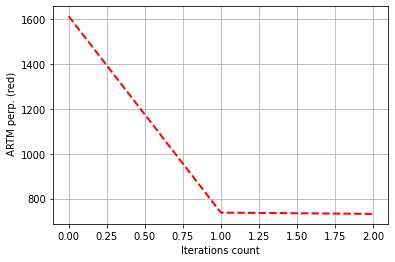

In [18]:
print_measures(model_artm)

In [19]:
model_artm.regularizers.add(artm.SmoothSparsePhiRegularizer(name='SparsePhi', tau=-0.15, 
                                                            topic_names=['topic_{}'.format(i) for i in range(1, 200)],
                                                            ))
model_artm.regularizers.add(artm.SmoothSparseThetaRegularizer(name='SparseTheta', tau=-0.15, 
                                                              topic_names=['topic_{}'.format(i) for i in range(1, 200)]))

In [20]:
model_artm.fit_offline(batch_vectorizer=batch_vectorizer,num_collection_passes=1)

In [21]:
# будем постепенно увеличивать значения этих регуляризаторов
phi_tau = model_artm.regularizers['SparsePhi'].tau
theta_tau = model_artm.regularizers['SparseTheta'].tau

for i in range(10):
    model_artm.regularizers['SparsePhi'].tau = (phi_tau + (phi_tau*0.5))
    model_artm.regularizers['SparseTheta'].tau = (theta_tau + (theta_tau*0.1))
    
    model_artm.fit_offline(batch_vectorizer=batch_vectorizer,num_collection_passes=1)

/usr/local/lib/python3.7/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.7/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Sparsity Phi: 0.886 ARTM)
Sparsity Theta: 0.763 (ARTM)
Kernel contrast: 0.359 (ARTM)
Kernel purity: 0.539 (ARTM)
Perplexity: 229.923 (ARTM)


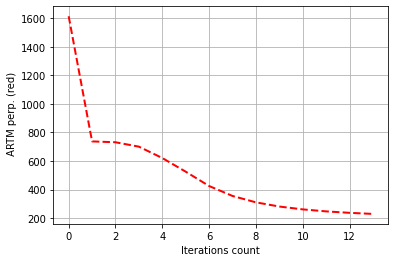

In [22]:
# посмотрим на качество
print_measures(model_artm)

In [24]:
# посмотрим на темы
for topic_name in model_artm.topic_names[:3]:
    print(topic_name + ': ')
    try:
        for x in model_artm.score_tracker['TopTokensScore_1'].last_tokens[topic_name]:
            print(x)
        print('---------')
    
    except KeyError: # можно перекрутить параметры и некоторые темы окажутся пустыми
        continue

topic_0: 
список
фамилия
представить
происхождение
различный
труд
носитель
социалистический
значение
носить
---------
topic_1: 
декабрь
против
объявить
1972
провести
арена
март
ноябрь
апрель
вновь
---------
topic_2: 
император
ян
правление
хан
бежать
двор
династия
убить
константин
империя
---------


## модель 2

попробуем сильнее фильтровать словарь, а также сильнее регулировать модель

In [26]:
texts = open('wiki_data.txt').read().splitlines()
texts = opt_normalize([tokenize(text.lower()) for text in texts], 30000)

f = open('wiki_texts.vw', 'w')

for i, text in enumerate(texts):
    c = Counter(text)
    doc = 'doc_'+ str(i) + ' '
    vw_text = ' '.join([x+':'+str(c[x]) for x in c])
    
    f.write(doc + vw_text  + '\n')
f.close()


batch_vectorizer = artm.BatchVectorizer(data_path='wiki_texts.vw',  # название файла
                                        data_format='vowpal_wabbit', # формат файла, у нас vw
                                        target_folder='batches', # название папки в которую положаться батчи
                                       batch_size=1000) # размер батча, подбирайте под свою память


batch_vectorizer = artm.BatchVectorizer(data_path='batches', # название папки с батчами
                                        data_format='batches') # указываем формат - батчи

dictionary = artm.Dictionary()


dictionary.gather(data_path='batches')
dictionary.filter(class_id='@default_class',
                  min_df=50, max_df=1500)


dictionary.save_text('dict.txt')


model_artm = artm.ARTM(topic_names=['topic_{}'.format(i) for i in range(200)],
                       
                       regularizers=[
                           artm.DecorrelatorPhiRegularizer(
                                            name='Decorr', tau=0.25, 
                                            class_ids=['@default_class'],
                                            topic_names=['topic_{}'.format(i) for i in range(0, 200)]),
                           
                           artm.SmoothSparsePhiRegularizer(
                                            name='SmoothPhi_1', 
                                            class_ids=['@default_class'],
                                            tau=0.15, 
                                            topic_names=['topic_{}'.format(i) for i in range(0, 200)])
                                    ]
                        )


model_artm.initialize(dictionary=dictionary, )


# добавляем метрики
model_artm.scores.add(artm.PerplexityScore(name='PerplexityScore',
                                                    dictionary=dictionary))
model_artm.scores.add(artm.SparsityPhiScore(name='SparsityPhiScore')) # разреженность слов в темах
model_artm.scores.add(artm.SparsityThetaScore(name='SparsityThetaScore')) # разреженность тем в доках
model_artm.scores.add(artm.TopicKernelScore(name='TopicKernelScore', probability_mass_threshold=0.1)) # когерентность по семантичесим ядрам
model_artm.scores.add(artm.TopTokensScore(class_id='@default_class', name='TopTokensScore_1', num_tokens=10)) # топ-n-слов для каждой темы



model_artm.num_document_passes = 2
model_artm.fit_offline(batch_vectorizer=batch_vectorizer, num_collection_passes=3)

Sparsity Phi: 0.000 ARTM)
Sparsity Theta: 0.000 (ARTM)
Kernel contrast: 0.006 (ARTM)
Kernel purity: 0.003 (ARTM)
Perplexity: 168.800 (ARTM)


/usr/local/lib/python3.7/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


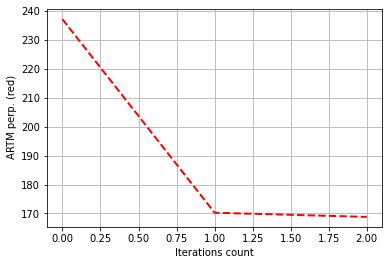

In [27]:
print_measures(model_artm)

видим что уже перплексия меньше чем была 

In [28]:
model_artm.regularizers.add(artm.SmoothSparsePhiRegularizer(name='SparsePhi', tau=-0.15, 
                                                            topic_names=['topic_{}'.format(i) for i in range(1, 200)],
                                                            ))
model_artm.regularizers.add(artm.SmoothSparseThetaRegularizer(name='SparseTheta', tau=-0.15, 
                                                              topic_names=['topic_{}'.format(i) for i in range(1, 200)]))

In [29]:
# будем постепенно увеличивать значения этих регуляризаторов
phi_tau = model_artm.regularizers['SparsePhi'].tau
theta_tau = model_artm.regularizers['SparseTheta'].tau

for i in range(10):
    model_artm.regularizers['SparsePhi'].tau = (phi_tau + (phi_tau*0.7))
    model_artm.regularizers['SparseTheta'].tau = (theta_tau + (theta_tau*0.3))
    
    model_artm.fit_offline(batch_vectorizer=batch_vectorizer,num_collection_passes=1)

Sparsity Phi: 0.819 ARTM)
Sparsity Theta: 0.802 (ARTM)
Kernel contrast: 0.361 (ARTM)
Kernel purity: 0.553 (ARTM)
Perplexity: 68.053 (ARTM)


/usr/local/lib/python3.7/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


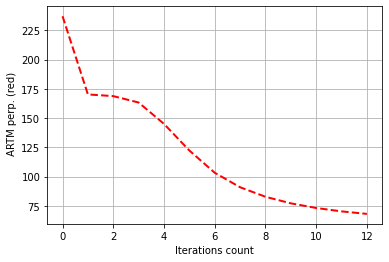

In [30]:
# посмотрим на качество
print_measures(model_artm)

видим также хорошие результаты по перплексии

In [31]:
# посмотрим на темы
for topic_name in model_artm.topic_names[:3]:
    print(topic_name + ': ')
    try:
        for x in model_artm.score_tracker['TopTokensScore_1'].last_tokens[topic_name]:
            print(x)
        print('---------')
    
    except KeyError: # можно перекрутить параметры и некоторые темы окажутся пустыми
        continue

topic_0: 
япония
испания
1988
фамилия
корея
франция
пятый
1992
1968
третий
---------
topic_1: 
доллар
000
отказаться
заявление
объявить
миллион
выступить
подать
представитель
протест
---------
topic_2: 
император
царь
римский
бежать
правление
хан
сообщать
источник
двор
вскоре
---------


В общем можем сделать вывод что добавление регуляризаторов дает позитивный прирост по метрикам и улучшает модель. В последнем вариаенте я ставил регуляцию еще больше чем было до этого.